In [1]:
import glob, os, cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
# objects = glob.glob('./data/objects_extracted/bicycles/*.png')
objects = glob.glob('./data/objects_extracted/*/*.png')

In [3]:
df = pd.DataFrame(objects,columns=['path'])
df['path'].astype(str)

0          ./data/objects_extracted/hiccups/40_1_4.png
1          ./data/objects_extracted/hiccups/21_1_0.png
2          ./data/objects_extracted/hiccups/21_4_3.png
3         ./data/objects_extracted/hiccups/40_0_23.png
4          ./data/objects_extracted/hiccups/30_2_2.png
                             ...                      
3267     ./data/objects_extracted/bicycles/60_6_28.png
3268    ./data/objects_extracted/bicycles/59_10_23.png
3269     ./data/objects_extracted/bicycles/60_6_19.png
3270      ./data/objects_extracted/bicycles/51_4_4.png
3271      ./data/objects_extracted/bicycles/61_0_7.png
Name: path, Length: 3272, dtype: object

In [4]:
df.head()

,path
0,./data/objects_extracted/hiccups/40_1_4.png
1,./data/objects_extracted/hiccups/21_1_0.png
2,./data/objects_extracted/hiccups/21_4_3.png
3,./data/objects_extracted/hiccups/40_0_23.png
4,./data/objects_extracted/hiccups/30_2_2.png


In [5]:
len(df)

3272

In [117]:
images = []
images_flat = []

for index, row in df.iterrows():
    img = cv2.imread(row.path)
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    img = cv2.resize(img, (240,240))
    images.append(img)
    images_flat.append(img.flatten())
    
images = np.array(images)
images_flat = np.array(images_flat)

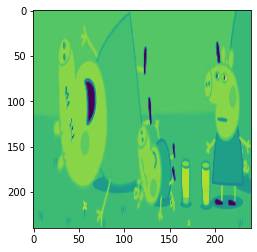

In [118]:
plt.imshow(images[3])

## Hog extraction

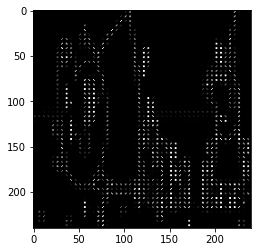

In [121]:
from skimage.feature import hog
from skimage import exposure
image = images[3]

fd, hog_image = hog(image, orientations=8, pixels_per_cell=(5, 5),
                    cells_per_block=(1, 1), visualize=True, multichannel=False)
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

plt.imshow(hog_image_rescaled,cmap=plt.cm.gray)

In [139]:
hog_images = []
flat_hog_images = [] 

for index, row in df.iterrows():
    img = cv2.imread(row.path)
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    fd, hog_image = hog(img, orientations=8, pixels_per_cell=(5, 5),
                    cells_per_block=(1, 1), visualize=True, multichannel=False)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
#     img = cv2.resize(img, (240,240))
    hog_images.append(hog_image_rescaled)
    flat_hog_images.append(hog_image_rescaled.flatten())
    
# hog_images = np.array(hog_images)
# flat_hog_images = np.array(flat_hog_images)

In [157]:
print(fd.shape, hog_image.shape)

(120,) (26, 16)


In [158]:
print(hog_image_rescaled.shape)

(26, 16)


In [141]:
print(hog_images.shape, flat_hog_images.shape)

AttributeError: 'list' object has no attribute 'shape'

In [74]:
object_ids = []
document_id = []
frames = []
objets_num = []


dict_info = {}
for index, row in df.iterrows():
#     print(os.path.basename(row.path[:-4]).split('_'))

    object_ids.append(os.path.basename(row.path[:-4]))
    info = os.path.basename(row.path[:-4]).split('_')
    
    document_id.append(info[0])
    frames.append(info[1])
    objets_num.append(info[2])


In [75]:
df['id'] = object_ids
df['document_id'] = document_id
df['frame_id'] = frames
df['object'] = objets_num

In [76]:
df.head()

,path,id,document_id,frame_id,object
0,./data/objects_extracted/hiccups/40_1_4.png,40_1_4,40,1,4
1,./data/objects_extracted/hiccups/21_1_0.png,21_1_0,21,1,0
2,./data/objects_extracted/hiccups/21_4_3.png,21_4_3,21,4,3
3,./data/objects_extracted/hiccups/40_0_23.png,40_0_23,40,0,23
4,./data/objects_extracted/hiccups/30_2_2.png,30_2_2,30,2,2


In [77]:
df = df[['id','document_id', 'frame_id','object','path']]

In [78]:
df.head(10)

,id,document_id,frame_id,object,path
0,40_1_4,40,1,4,./data/objects_extracted/hiccups/40_1_4.png
1,21_1_0,21,1,0,./data/objects_extracted/hiccups/21_1_0.png
2,21_4_3,21,4,3,./data/objects_extracted/hiccups/21_4_3.png
3,40_0_23,40,0,23,./data/objects_extracted/hiccups/40_0_23.png
4,30_2_2,30,2,2,./data/objects_extracted/hiccups/30_2_2.png
5,26_1_16,26,1,16,./data/objects_extracted/hiccups/26_1_16.png
6,21_0_33,21,0,33,./data/objects_extracted/hiccups/21_0_33.png
7,25_2_7,25,2,7,./data/objects_extracted/hiccups/25_2_7.png
8,25_1_33,25,1,33,./data/objects_extracted/hiccups/25_1_33.png
9,26_2_2,26,2,2,./data/objects_extracted/hiccups/26_2_2.png


### PCA  +  K - Means

In [79]:
# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [279]:
pca = PCA()
pca_images = pca.fit_transform(images_flat)
img_sum_variance = np.cumsum(pca.explained_variance_ratio_)

Text(0.5, 1.0, 'PCA Cumulative variance')

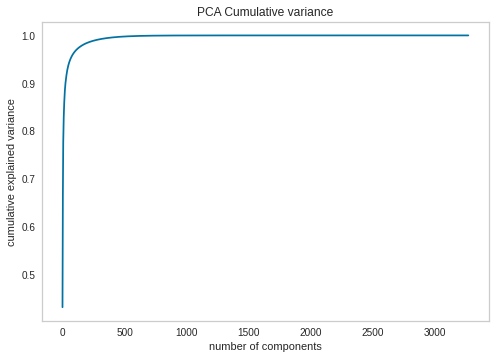

In [280]:
plt.plot(img_sum_variance)
plt.grid()
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title('PCA Cumulative variance')

In [281]:
pca = PCA(n_components = 0.98)
pca_images = pca.fit_transform(images_flat)

In [282]:
print("PCA 98% : {}".format(len(pca_images[0])))

PCA 98% : 165


In [287]:
print("flat shape : {} \npca Shape : {}".format(images_flat.shape, pca_images.shape))

flat shape : (3272, 57600) 
pca Shape : (3272, 165)


### Silouhette , Elbow, coherence pour nombre de cluster K

In [288]:
X = pca_images
# X = images_flat

In [289]:
print(X.shape)

(3272, 165)


## Elbow

KeyboardInterrupt: 

Exception ignored in: 'sklearn.cluster._k_means_fast._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 2, in where
KeyboardInterrupt: 


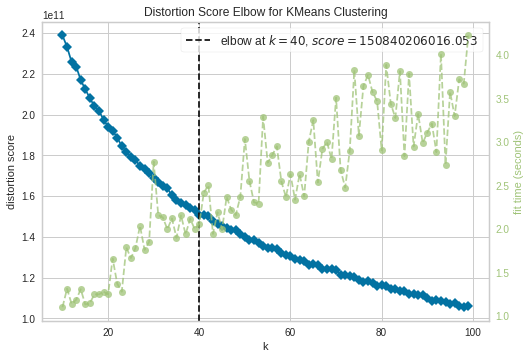

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [290]:
from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(10,100), timings=True)

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

## Silhouette 

In [42]:
from sklearn.metrics import silhouette_samples, silhouette_score

Automatically created module for IPython interactive environment


<ipython-input-43-0ced3c505586>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


ValueError: x and y must be the same size

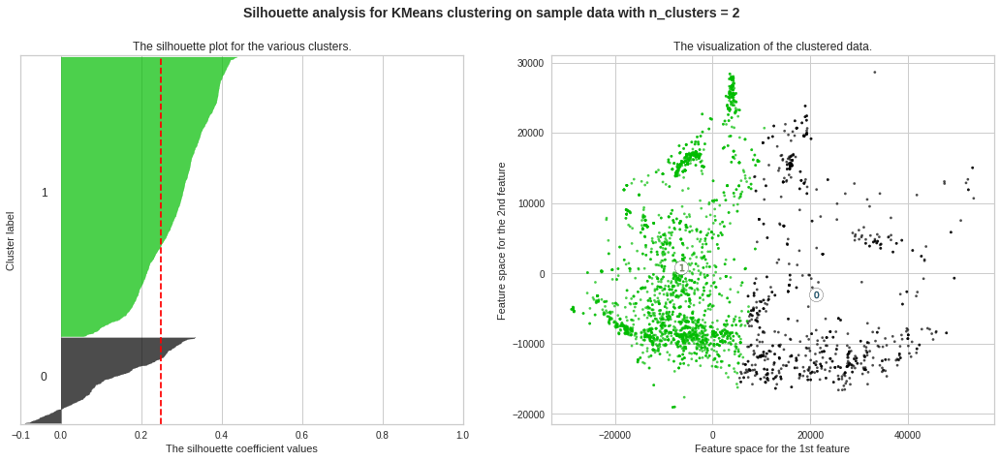

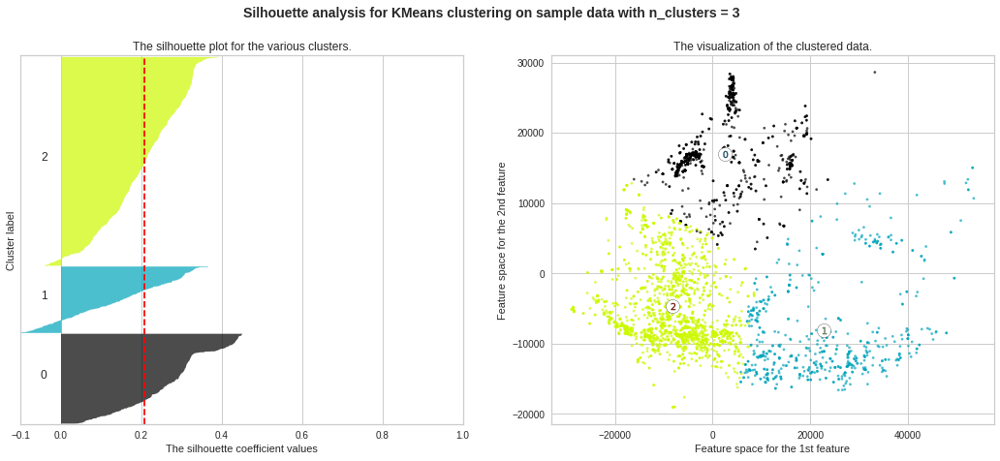

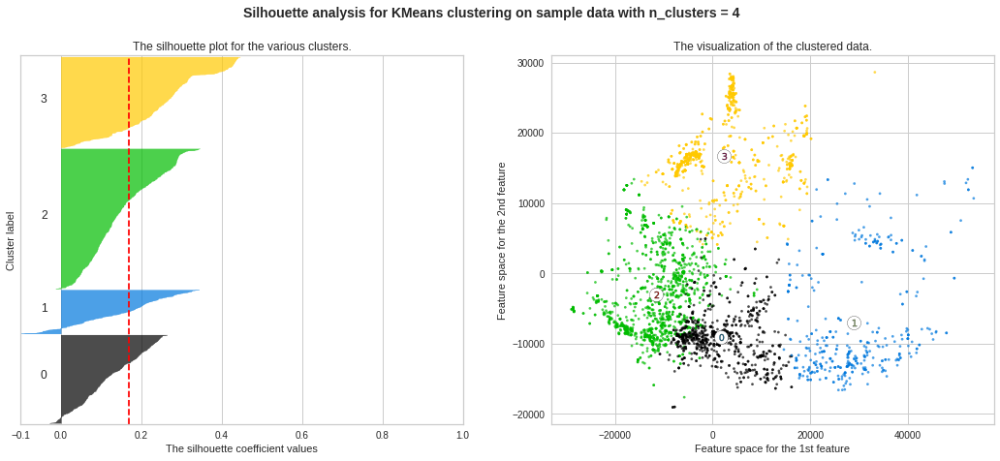

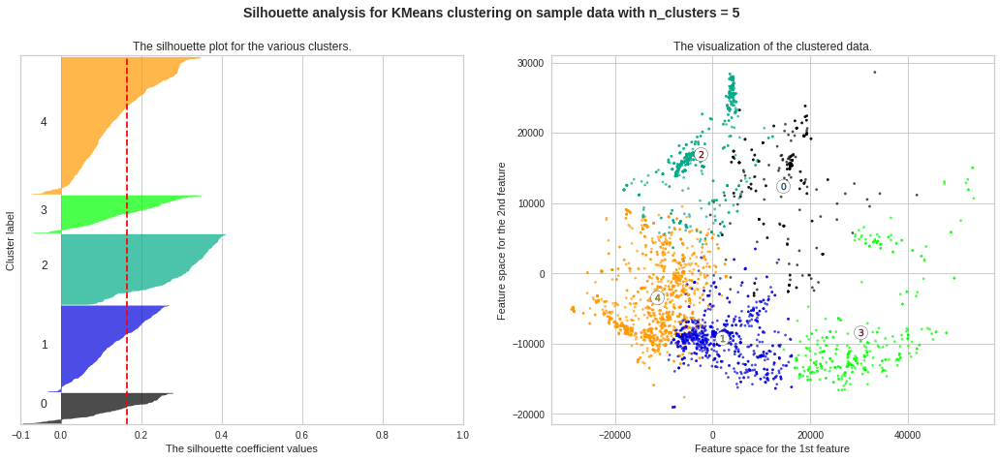

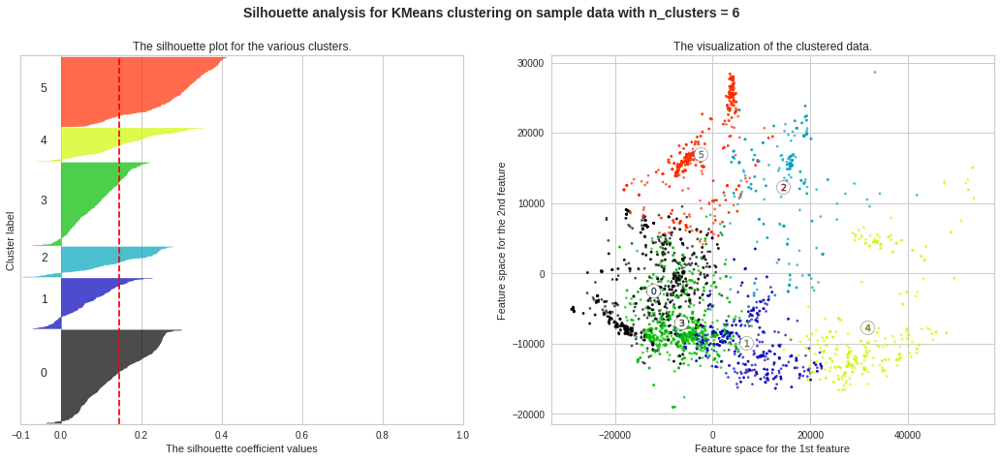

...

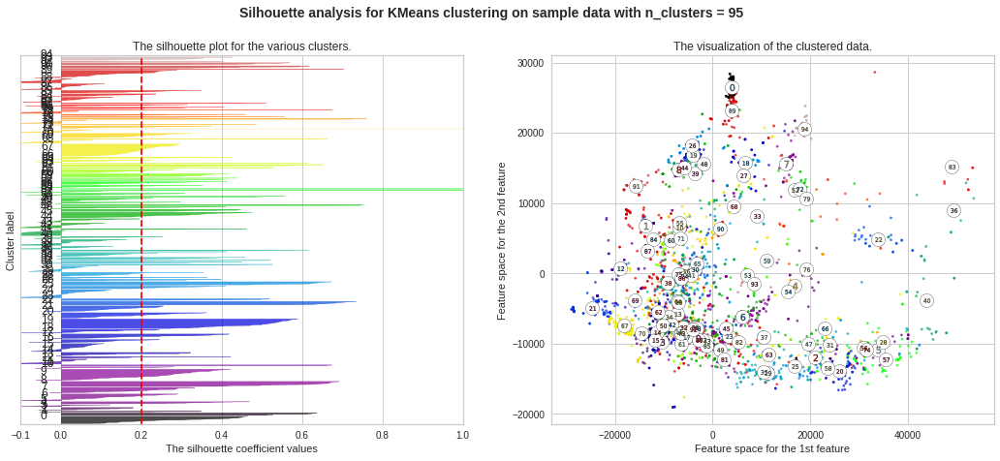

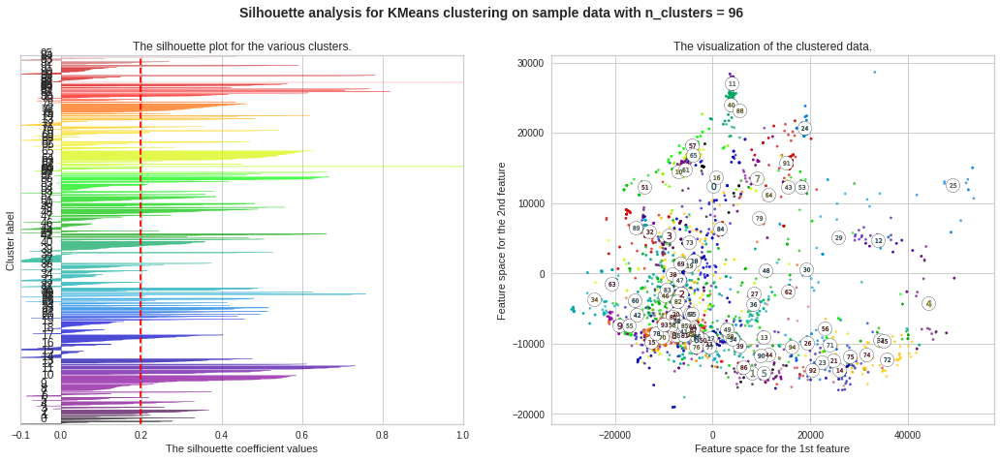

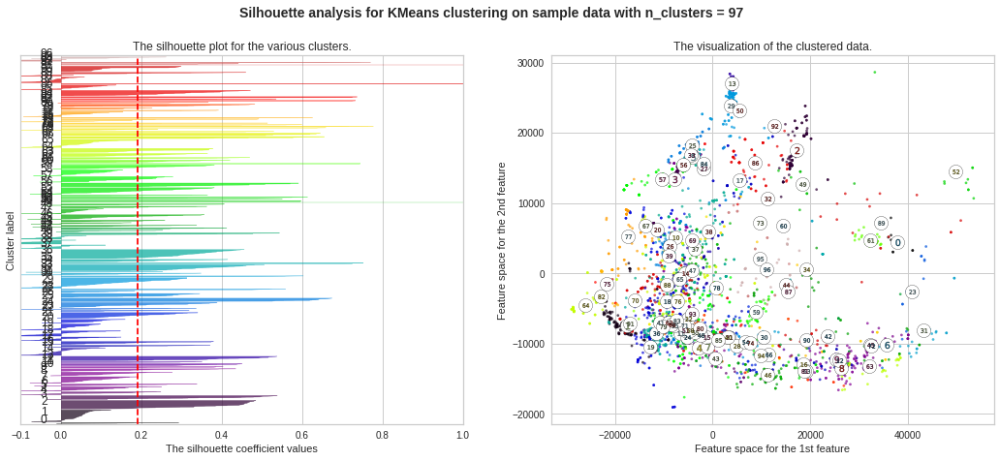

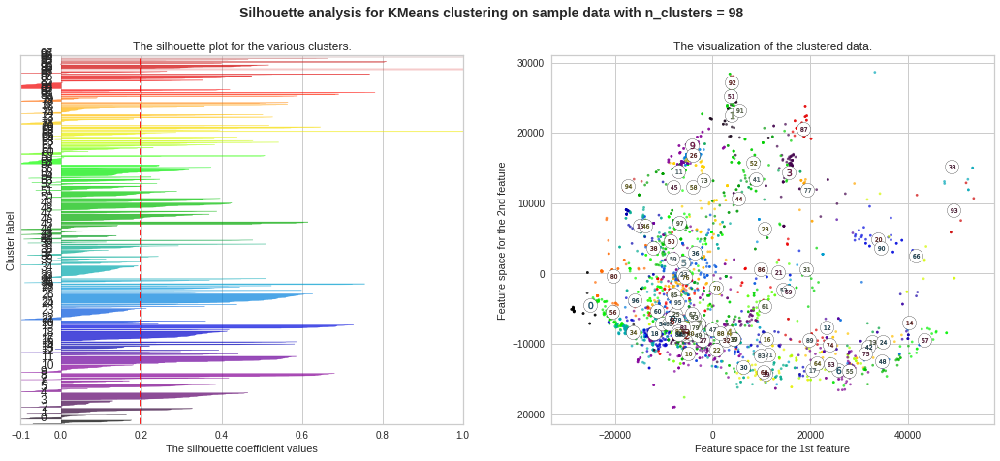

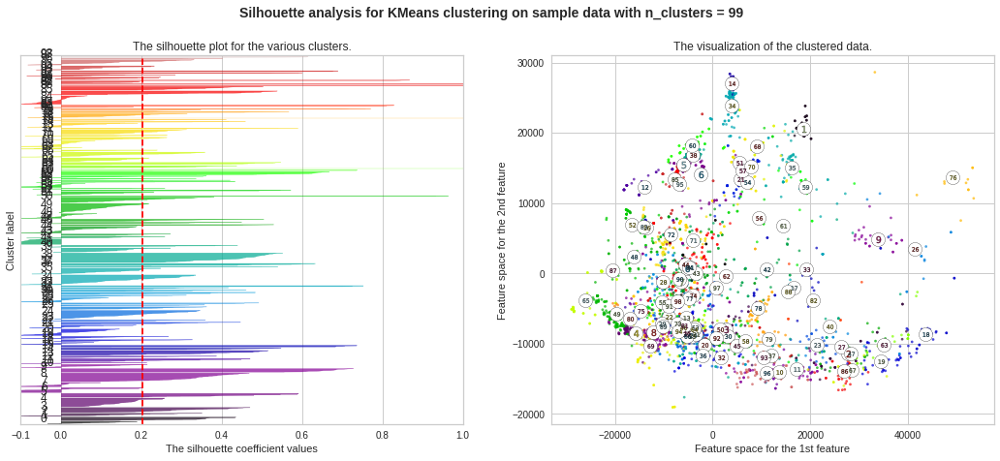

In [43]:
import matplotlib.cm as cm
print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.

range_n_clusters = [i for i in range(20,60)]
sil_avg = []

for n_clusters in range(2,100):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
#     print("For n_clusters =", n_clusters,
#           "The average silhouette_score is :", silhouette_avg)
    
    sil_avg.append(silhouette_avg)
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    
    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    
    

# plt.show()
plt.scatter(range_n_clusters, silhouette_avg )

ValueError: shape mismatch: objects cannot be broadcast to a single shape

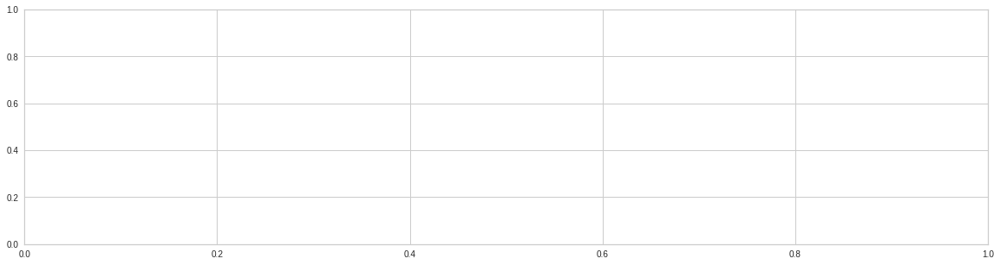

In [45]:
f, ax = plt.subplots(figsize=(20,5))
plt.bar(range_n_clusters[:-1], sil_avg)
plt.xlabel('Silhouette score', fontsize=16)
plt.ylabel('Number of Clusters', fontsize=16)
plt.tick_params(labelsize=20)

## Dendogramme

In [290]:
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)
    
    
    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
    return linkage_matrix
    


In [279]:
np.array(images).shape

(3272, 32, 32, 3)

In [280]:
np.array(images_flat).shape

(3272, 3072)

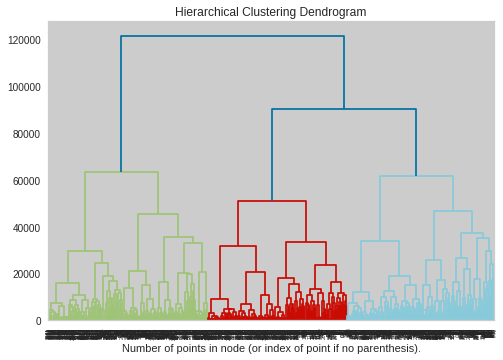

<Figure size 21600x21600 with 0 Axes>

In [262]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(X)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=10)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.figure(figsize=(300, 300))
plt.show()

Est-ce que l'axe des y représente la distance entre le centroid du nouveau cluster et lobjet? et Lorsque on place une cluster d'un centroid a distance egale de n points, alors l'axe des y est la distance maximal du point le eloigné, donc ?

In [261]:
plt.figure(figsize=(30, 300))
plt.show()

<Figure size 2160x21600 with 0 Axes>

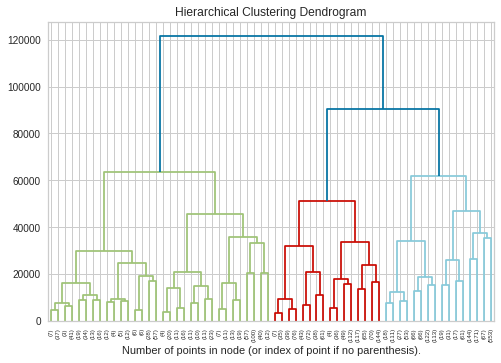

<Figure size 2160x2160 with 0 Axes>

In [293]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(pca_images)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=5)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.figure(figsize=(30, 30))
plt.show()

## Building Matrix :  Topic - Cluster 

In [260]:
print(images_flat.shape, pca_images.shape)

(3272, 172800) (3272, 244)


In [126]:
# X = images_flat
# X = pca_images
X = flat_hog_images

In [138]:
X.shape

(3272,)

In [125]:
nb_clusters = 38

kmeans = KMeans(n_clusters = nb_clusters, n_jobs = -1, random_state = 22)
kmeans.fit(X)

ValueError: setting an array element with a sequence.

In [247]:
df['cluster'] = kmeans.labels_

In [248]:
print(len(kmeans.labels_))

3272


In [249]:
print(len(kmeans.cluster_centers_))

28


In [250]:
from sklearn.metrics import pairwise_distances_argmin_min
closest, _ = pairwise_distances_argmin_min(kmeans.cluster_centers_, X)

In [251]:
closest

array([  51, 2706,  688, 1603, 2081, 1118,  327,  799, 2618, 1990, 1098,
       1765,  536, 2800, 2855,  258,   48, 2454,  290, 2006, 1881, 2635,
       1664, 2255,  648, 2798, 2413, 3123])

In [252]:
centroids = []
for i in range(len(df)):
    if(i in closest): centroids.append(1)
    else: centroids.append(0)
        
df['centroid'] = centroids   

In [253]:
df.head()

,id,document_id,frame_id,object,path,cluster,centroid
0,40_1_4,40,1,4,./data/objects_extracted/hiccups/40_1_4.png,13,0
1,21_1_0,21,1,0,./data/objects_extracted/hiccups/21_1_0.png,16,0
2,21_4_3,21,4,3,./data/objects_extracted/hiccups/21_4_3.png,7,0
3,40_0_23,40,0,23,./data/objects_extracted/hiccups/40_0_23.png,9,0
4,30_2_2,30,2,2,./data/objects_extracted/hiccups/30_2_2.png,13,0


In [254]:
cl0 = df.loc[df['cluster'] == 40]
cl0.head()

,id,document_id,frame_id,object,path,cluster,centroid


In [255]:
cl1 = df.loc[df['cluster'] == 1]

In [256]:
def plot_cluster(df, cluster, amount=10):
    cl = df.loc[df['cluster'] == cluster][:amount]
    
    images = []
    for index, row in cl.iterrows():
        img = cv2.imread(row.path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)
        
#     plt.close
#     plt.clf()
    f, axarr = plt.subplots(1,amount)
    f.set_size_inches(15, 15)
#     f.suptitle("Cluster #{}".format(cluster))
    for i in range(amount):
        axarr[i].imshow(images[i])
        

In [257]:
def plot_cluster_all(df, cluster, amount=10):

#     plt.close
#     plt.clf()
    f, axarr = plt.subplots(10,amount)
    f.set_size_inches(15, 15)
#     f.suptitle("Cluster #{}".format(cluster))
    for i in range(37):
        cl = df.loc[df['cluster'] == i][:amount]
        images = []
        for index, row in cl.iterrows():
            img = cv2.imread(row.path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            images.append(img)
        
        for j in range(amount):
            axarr[i,j].imshow(images[i])
            print(i,j)
            
    plt.subplots()

IndexError: list index out of range

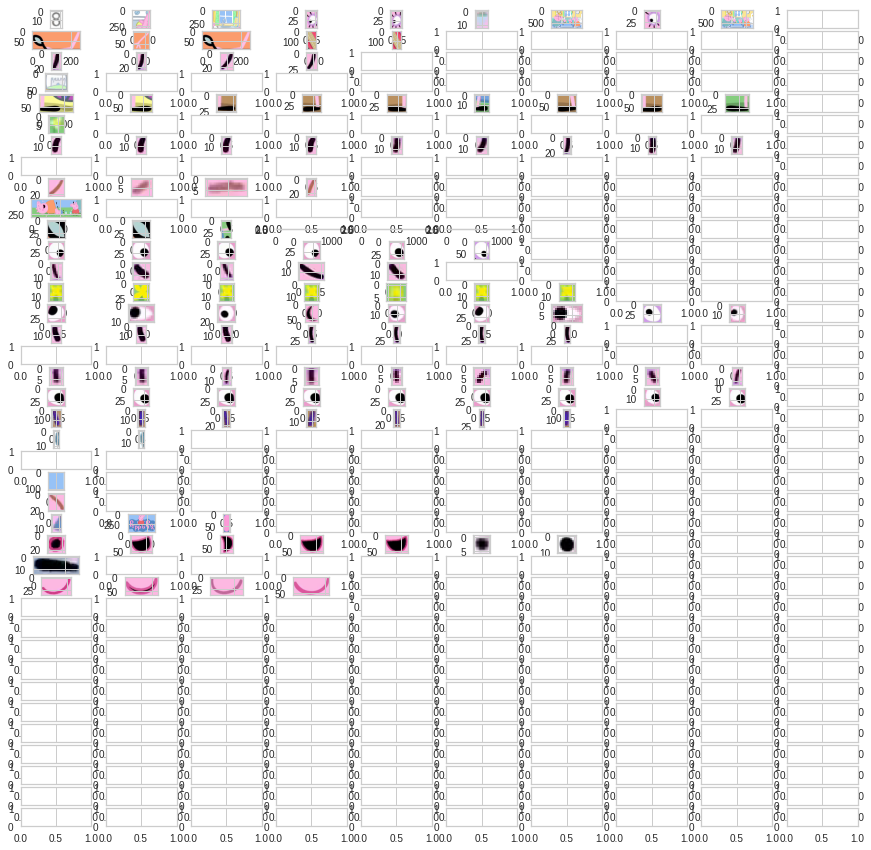

In [259]:
#     plt.close
#     plt.clf()
f, ax = plt.subplots(39,10)
f.set_size_inches(15, 15)
#     f.suptitle("Cluster #{}".format(cluster))
for i in range(37):
    cl = df.loc[df['cluster'] == i][:10]
    images = []
    for index, row in cl.iterrows():
        img = cv2.imread(row.path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)

    for j in range(len(images[j])%10):
            ax[i,j].imshow(images[j])


In [ ]:
plot_cluster_all(df,1,)

<ipython-input-438-706d12113830>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axarr = plt.subplots(1,amount)


<Figure size 576x396 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

<Figure size 504x504 with 0 Axes>

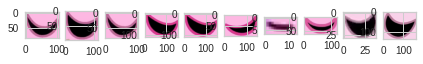

In [442]:
for i in range(40):
    plot_cluster(df, i, 10)

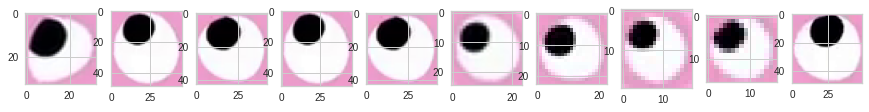

In [243]:
plot_cluster(df, 15, 10)

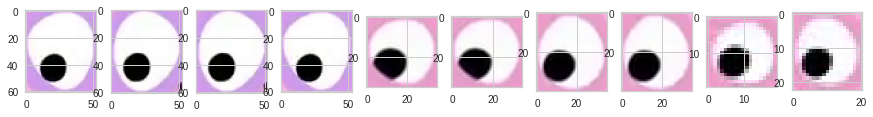

In [244]:
plot_cluster(df, 22, 10)

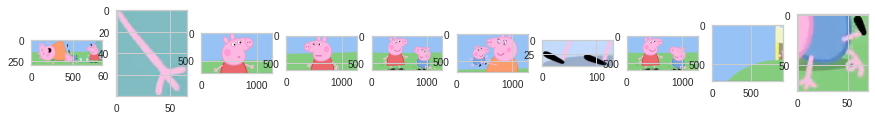

In [148]:
plot_cluster(df, 21, 10)

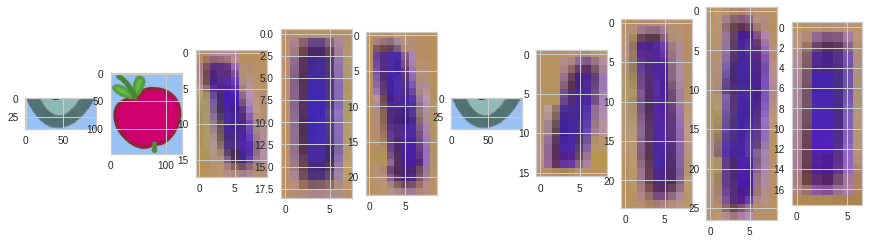

In [208]:
plot_cluster(df, 4, 10)

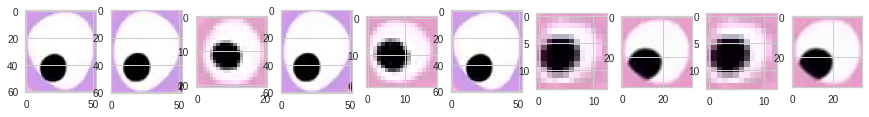

In [149]:
plot_cluster(df, 32, 10)

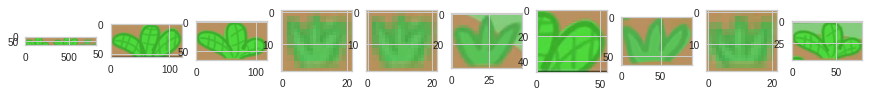

In [150]:
plot_cluster(df, 37, 10)

In [564]:
doc = pd.read_csv('/home/ziz/school/LOG795/ILS-SUMM-master/data/csv/with_pretreatment_span_3_pfe - with_pretreatment_span_3_pfe.csv',dtype=str)
doc = doc.rename(columns={"Unnamed: 0":'doc_id'})
doc = doc[['doc_id','sentence','title']]
doc.head(5)

,doc_id,sentence,title
0,0,little brother george bobby daddy pepper,gardening
1,1,george playing granny grandpa house cat dream ...,gardening
2,2,grandpa planting seed would still seed grow pl...,gardening
3,3,little hole put seed cover earth water everyth...,gardening
4,4,seed like even big apple tree yes tiny seed gr...,gardening


In [409]:
for index, row in doc.iterrows():
    for topic in row.sentence.split(' '):
        data = {'doc_id':row.doc_id,'topic':topic}
        topics = topics.append(data,ignore_index=True)


In [565]:
topics.head(10)

,doc_id,topic
0,0,little
1,0,brother
2,0,george
3,0,bobby
4,0,daddy
5,0,pepper
6,1,george
7,1,playing
8,1,granny
9,1,grandpa


In [477]:
objets = df[['id','document_id','path','cluster']].rename(columns={"document_id":'doc_id'})
objets.head()

,id,doc_id,path,cluster
0,40_1_4,40,./data/objects_extracted/hiccups/40_1_4.png,14
1,21_1_0,21,./data/objects_extracted/hiccups/21_1_0.png,34
2,21_4_3,21,./data/objects_extracted/hiccups/21_4_3.png,24
3,40_0_23,40,./data/objects_extracted/hiccups/40_0_23.png,9
4,30_2_2,30,./data/objects_extracted/hiccups/30_2_2.png,14


In [479]:
topic_objet = topics
topic_objet = topics.merge(objets, left_on='doc_id',right_on='doc_id')
topic_objet.head(5)

,doc_id,topic,id,path,cluster
0,0,little,0_1_1,./data/objects_extracted/gardening/0_1_1.png,3
1,0,little,0_1_22,./data/objects_extracted/gardening/0_1_22.png,3
2,0,little,0_1_10,./data/objects_extracted/gardening/0_1_10.png,3
3,0,little,0_1_26,./data/objects_extracted/gardening/0_1_26.png,3
4,0,little,0_1_19,./data/objects_extracted/gardening/0_1_19.png,3


In [547]:
topic_objet.to_csv('/home/ziz/school/LOG795/ILS-SUMM-master/data/csv/objets_cluster.csv')

In [483]:
matrice_topic_objet = topic_objet.groupby(['topic','cluster']).size().unstack(fill_value=0)

In [516]:
matrice_topic_objet.head(20)

cluster,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
topic,,,,,,,,,,,,,,,,,,,,,
aah,2,0,0,0,0,0,0,0,0,4,...,4,0,0,0,0,0,0,0,0,2
accordion,19,0,12,1,0,8,7,8,6,1,...,0,0,0,5,0,12,1,1,15,5
age,0,1,0,0,0,0,0,0,2,1,...,0,0,1,0,0,0,0,0,0,0
anymore,1,11,0,3,3,6,4,1,2,9,...,1,5,8,2,0,2,3,7,2,1
anyone,5,0,0,0,1,8,5,0,0,1,...,0,0,0,0,0,0,1,7,3,0
apple,0,90,0,22,18,0,16,0,12,20,...,108,8,4,36,0,0,58,0,0,6
around,2,3,2,2,1,0,5,6,0,7,...,0,0,0,10,0,3,0,5,1,1
attic,5,0,0,0,1,8,5,0,0,1,...,0,0,0,0,0,0,1,7,3,0
away,0,0,0,4,4,4,0,2,0,0,...,12,0,0,2,0,0,18,2,0,0


In [574]:
matrice_topic_objet_ones = matrice_topic_objet.where(matrice_topic_objet < 1, 1)
matrice_topic_objet_ones.head(20)

cluster,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
topic,,,,,,,,,,,,,,,,,,,,,
aah,1,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,1
accordion,1,0,1,1,0,1,1,1,1,1,...,0,0,0,1,0,1,1,1,1,1
age,0,1,0,0,0,0,0,0,1,1,...,0,0,1,0,0,0,0,0,0,0
anymore,1,1,0,1,1,1,1,1,1,1,...,1,1,1,1,0,1,1,1,1,1
anyone,1,0,0,0,1,1,1,0,0,1,...,0,0,0,0,0,0,1,1,1,0
apple,0,1,0,1,1,0,1,0,1,1,...,1,1,1,1,0,0,1,0,0,1
around,1,1,1,1,1,0,1,1,0,1,...,0,0,0,1,0,1,0,1,1,1
attic,1,0,0,0,1,1,1,0,0,1,...,0,0,0,0,0,0,1,1,1,0
away,0,0,0,1,1,1,0,1,0,0,...,1,0,0,1,0,0,1,1,0,0


In [571]:
matrice_topic_objet_ones

1

In [546]:
matrice_topic_objet.to_csv('/home/ziz/school/LOG795/ILS-SUMM-master/data/csv/topic_cluster.csv')

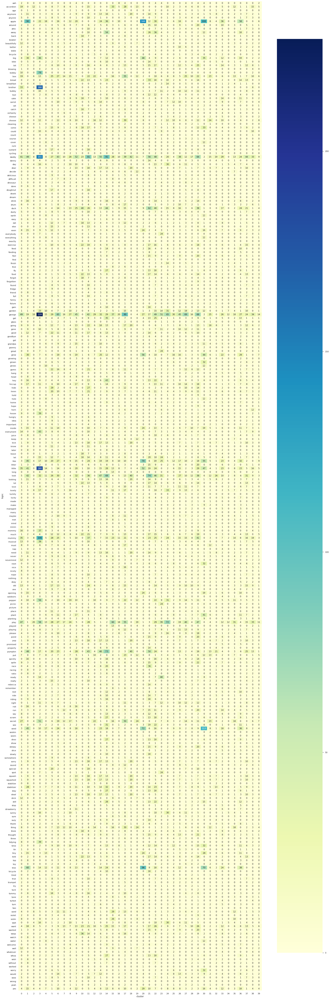

In [563]:
import seaborn as sns; sns.set_theme()
uniform_data = np.random.rand(10, 12)

fig, ax = plt.subplots(figsize=(30,100)) 
ax = sns.heatmap(matrice_topic_objet,annot=True, cmap="YlGnBu",  fmt='d')

In [535]:

nombre_lien = matrice_topic_objet.max(axis=1)
best_cluster = matrice_topic_objet.idxmax(axis=1)
topic_cluster = pd.DataFrame({'topic':best_cluster.index,'cluster':best_cluster.values,'count':nombre_lien.values})
topic_cluster = topic_cluster.sort_values('count',ascending=False)
topic_cluster.head(20)

,topic,cluster,count
85,george,3,228
127,little,3,180
23,brother,3,166
42,daddy,3,151
5,apple,20,144
198,seed,30,113
146,mummy,3,106
236,tree,20,96
125,like,20,78
19,bobby,3,78


<Figure size 576x396 with 0 Axes>

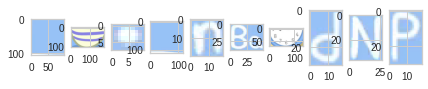

In [543]:
plot_cluster(df, 3, 10)

<Figure size 576x396 with 0 Axes>

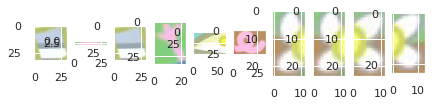

In [566]:
plot_cluster(df, 20, 10)

In [661]:
i = 2
img = images_flat[i]
centroid = kmeans.cluster_centers_[i]
print(img.shape)
print(centroid.shape)

(3072,)
(3072,)


doc_id                                                2
topic                                              seed
id                                                2_0_1
path       ./data/objects_extracted/gardening/2_0_1.png
cluster                                              30
Name: 566, dtype: object

In [672]:
i = 2
img = images_flat[i]
centroid = kmeans.cluster_centers_[30]
dist = np.linalg.norm(img - centroid)
print(dist)

5931.860885280504


In [674]:
X_dist = kmeans.transform(images_flat)**2

In [677]:
min_dist = []
for i in range(len(images_flat)):
    min_dist.append(np.amin(X_dist[i]))
    
print(min_dist)

[638562.904586047, 1515810.4791662768, 4005325.0135734086, 6734037.017366647, 2111461.832729787, 1647243.3208297936, 6925829.521926343, 1819509.9441358298, 1761371.9100577235, 1090941.9830624016, 5529063.774027168, 5024553.854575992, 6880212.014306396, 4005325.0135734086, 2905117.9433641583, 4005325.0135734086, 638562.904586047, 4173315.6091780667, 8552587.460153967, 11145344.021406323, 7168575.723141818, 1722526.4614595773, 5419094.709394515, 6870500.61829315, 2352403.70858486, 7446288.194195241, 5329363.605806439, 9059497.286506178, 4419809.8259454975, 5544627.869637803, 5332045.615515201, 567238.3989196568, 6093325.225937457, 2628175.1106607616, 1823818.2838895023, 7607084.9084809115, 1512424.1458329484, 5764284.658592821, 3117719.4407579, 1586163.865586355, 2080119.4843987974, 4715233.412715495, 1933912.1262697133, 5376577.16839671, 1922124.0502445698, 2034050.2951267662, 3172328.2660005987, 4306894.147639691, 1619420.81249962, 1960488.6483754518, 4416799.526880086, 1589107.7992372